# Polygonization by rivers & railways

In this notebook, for a given city, we
* load the city boundary polygon
* download (not yet save) OSM data on rivers/railways for this polygon
* process the different geometries to end up with one (multi)polygon defining all "natural" barriers
* use that polygon to derive urban blocks delineated by natural barriers
* count number of twitter users in each "natural" block
* visualize to explore results

In [85]:
# import warnings
# warnings.filterwarnings("ignore")
import os
# import sys
# import argparse
# import random
# from time import time
# import numpy as np
import pandas as pd
# import pickle
import matplotlib.pyplot as plt
import geopandas as gpd
# from shapely.geometry import LineString, Point, MultiPoint, MultiLineString, Polygon
# from tqdm import tqdm
# from geopy.distance import distance, geodesic, great_circle
import osmnx as ox
# import networkx as nx
# import scipy.stats
# from scipy.stats import ks_2samp
# import sklearn
# import igraph
# from igraph import Graph

# from random import choice
# from bisect import bisect_left
# import copy

# from functools import partial
# import pyproj
# from pyproj import Geod
# from pyproj.crs import ProjectedCRS
# from pyproj.crs.coordinate_operation import AzimuthalEquidistantConversion
# from shapely.ops import transform

# import yaml
# from utils import *
import shapely

In [86]:
import folium

In [87]:
ox.__version__

'1.9.3'

In [88]:
# set OSM highway tags
naturalbarriers_osm_labels = None
naturalbarriers_osm_filter = None

In [89]:
# create subfolders for output data
os.makedirs("../data/natural_barriers/", exist_ok=True)
os.makedirs("../data/natural_barriers/raw/", exist_ok=True)
os.makedirs("../data/natural_barriers/polygons/", exist_ok=True)

In [90]:
gdf_cbsacodes = gpd.read_file('../data/twitter_dummy/cbsacode_random.gpkg')
gdf_cbsacodes

,cbsacode,name,full_name,west,south,east,north,geometry
0,12420,Austin,Austin,-98.297600,29.630718,-97.024461,30.906188,"POLYGON ((-98.04989 30.62415, -98.04954 30.624..."
1,16980,Chicago,Chicago,-88.942146,40.736510,-86.929353,42.669906,"POLYGON ((-88.60224 41.63139, -88.61185 41.631..."
2,33100,Miami,Miami,-80.886232,25.137420,-79.974306,26.970943,"POLYGON ((-80.88123 26.33381, -80.88135 26.333..."
3,38300,Pittsburgh,Pittsburgh,-80.519280,39.720678,-78.974267,41.173134,"POLYGON ((-80.51904 40.47736, -80.51903 40.477..."
4,38900,Portland,Portland,-123.785567,44.885714,-121.514380,46.388629,"POLYGON ((-123.36162 45.77958, -123.36153 45.7..."


In [91]:
# define for which city to run 
cbsacode = 12420

In [92]:
target_city = gdf_cbsacodes[gdf_cbsacodes['cbsacode'] == cbsacode]
city_name = target_city['name'].values[0]
city_boundaries = target_city["geometry"].values[0]
print(f'Target city {city_name}')

Target city Austin


In [93]:
### Download and save OSM data

folder_osm = "../data/natural_barriers/raw/"


if os.path.exists(folder_osm + f'{cbsacode}_raw.parquet'):
    print("loading OSM data of natural barriers...")
    # TODO load data set
    print(f'{cbsacode} natural barriers loaded from file', flush=True)

else:
    print("downloading OSM data of natural barriers...")
    

downloading OSM data of natural barriers...


Download data sets

In [94]:
waterways = ox.features_from_polygon(
    polygon=city_boundaries,
    tags = {
        'waterway':True, 
    }
)
waterways = waterways.explode(ignore_index=True)

railways = ox.features_from_polygon(
    polygon=city_boundaries,
    tags = {
        'railway':True, 
    }
)
railways = railways.explode(ignore_index=True)

Geometry type point: drop directly

In [95]:
waterways = waterways[waterways.geom_type != "Point"]
railways = railways[railways.geom_type != "Point"]

Geometry type polygon: For now, manual step: check if we can ignore the Polygon geometries

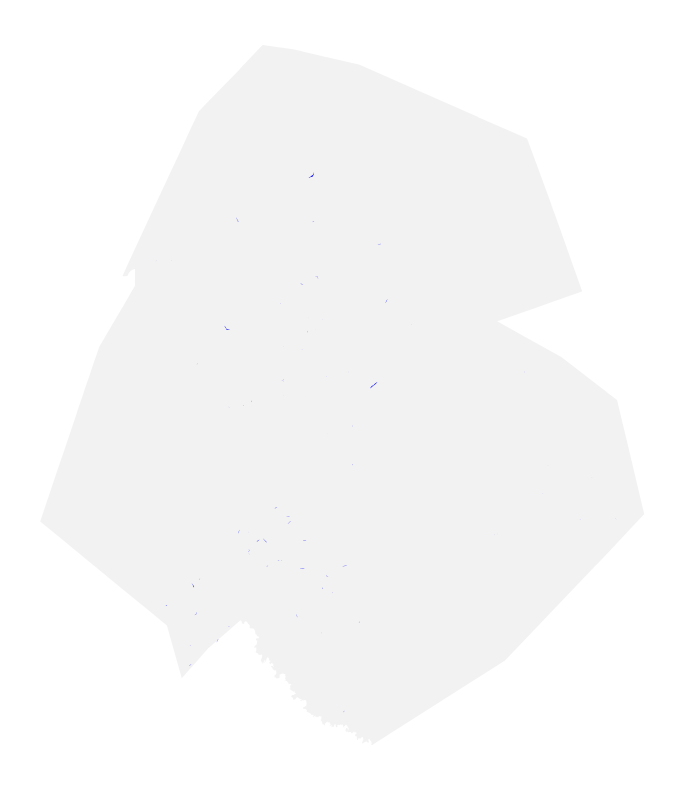

In [96]:
fig, ax = plt.subplots(1,1,figsize = (10,10))
gpd.GeoSeries([city_boundaries], crs=gdf_cbsacodes.crs).plot(ax=ax, alpha = .1, color = "grey")
railways[railways.geom_type =="Polygon"].plot(ax=ax, color = "red")
waterways[waterways.geom_type =="Polygon"].plot(ax=ax, color = "blue")
ax.set_axis_off()

yes we can:

In [97]:
waterways = waterways[waterways.geom_type != "Polygon"]
railways = railways[railways.geom_type != "Polygon"]

For linestrings, identify relevant tag values:

In [98]:
m = gpd.GeoSeries([city_boundaries],crs=waterways.crs).explore(
    opacity =.1, name = "city", tiles="CartoDB.Positron")
waterways[["waterway","geometry"]].explore(
    m=m,column = "waterway",name="waterway"
    )
folium.LayerControl().add_to(m)
m

executive decision: for this case, only keeping the linestrings with the tag "river"

In [99]:
m = gpd.GeoSeries([city_boundaries],crs=railways.crs).explore(
    opacity =.1, name = "city", tiles="CartoDB.Positron")
railways[["railway","geometry"]].explore(
    m=m,column = "railway",name="railway"
    )
folium.LayerControl().add_to(m)
m

executive decision: keeping only railway=rail

<Axes: >

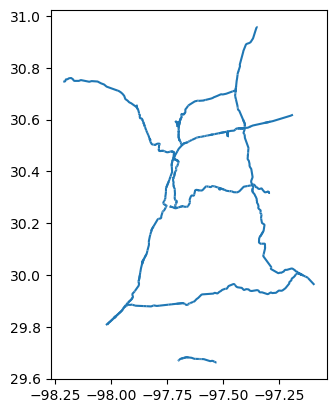

In [100]:
railways[railways.railway=="rail"][["geometry"]].plot()

<Axes: >

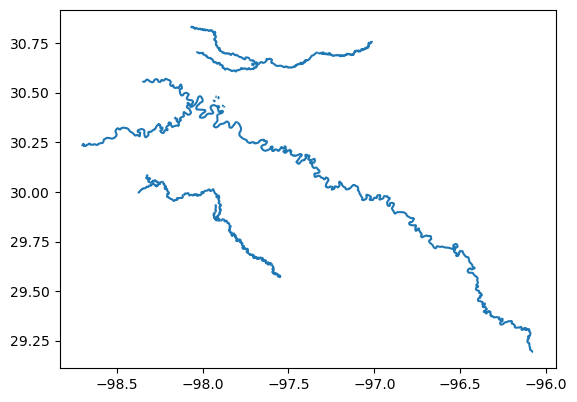

In [101]:
waterways[waterways.waterway=="river"][["geometry"]].plot()

In [102]:
waterways_tokeep = waterways[waterways.waterway=="river"][["geometry"]].copy().reset_index(drop=True)
waterways_tokeep["barrier_type"] = "river"

railways_tokeep = railways[railways.railway=="rail"][["geometry"]].copy().reset_index(drop=True)
railways_tokeep["barrier_type"] = "rail"

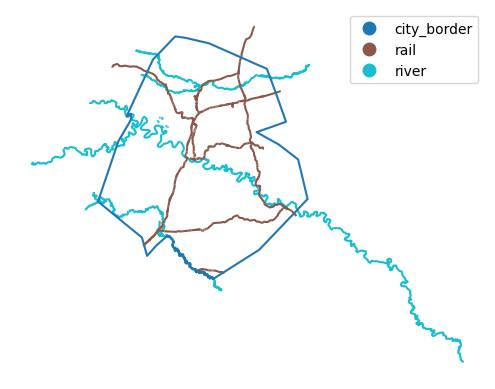

In [103]:
natbar = pd.concat(
    [
        waterways_tokeep,
        railways_tokeep,
        gpd.GeoDataFrame(
            {
                "geometry": [city_boundaries.boundary],
                "barrier_type": "city_border"
            },
        crs = target_city.crs
        )
    ]
)
fig, ax = plt.subplots(1,1)
natbar.plot(
    ax=ax,
    column="barrier_type",
    legend=True
)
ax.set_axis_off()

polygonize the lines

In [104]:
polygons = gpd.GeoSeries(
    shapely.polygonize(  # polygonize
        shapely.node(  # ensure properly nodded non-planar interesections
            shapely.GeometryCollection(  # need a single geometry for nodding
                natbar.geometry.array
            )
        ).geoms  # get parts of the collection from nodding
    ).geoms,  # get parts of the collection from polygonize
    crs=natbar.crs,
).explode(
    ignore_index=True
)  # shoudln't be needed but doesn't hurt to ensure

In [105]:
polygons = gpd.GeoDataFrame(
    {"geometry": polygons.geometry},
    crs=natbar.crs
)

count twitter users in each polygon (from RANDOM data!)

In [106]:
# read in nodes (RANDOMLY generated ones!)
nodes_gpkg = '../data/twitter_dummy/twitter_users_tract_random.gpkg'
nodes = gpd.read_file(nodes_gpkg)
nodes = nodes[nodes.cbsacode==cbsacode]

# count nodes in each polygon
nodes = nodes.to_crs(polygons.crs)
polygons["user_count"] = polygons.geometry.apply(lambda x: len(nodes.sindex.query(x, predicate="contains")))

In [110]:
m = gpd.GeoSeries([city_boundaries],crs=natbar.crs).explore(
    opacity =.1, name = "city", tiles="CartoDB.Positron")
natbar.explore(
    m=m, name="natural barriers", color = "black"
    )
polygons.explore(
    m=m, name = "polygons inbetween", opacity = 0.4, column = "user_count", cmap = "Set2"
)
folium.LayerControl().add_to(m)
m